## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

(720, 1280, 3)


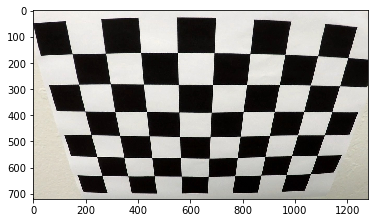

In [1]:
# Import libraries to be used 
import cv2
import glob
import os
import imageio
from moviepy.editor import VideoFileClip
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import deque
imageio.plugins.ffmpeg.download()

# Display one image 
%matplotlib inline
img = mpimg.imread('camera_cal/calibration2.jpg')
image_shape = img.shape
print(image_shape)
plt.imshow(img)

In [2]:
# rows observed in image in x direction : 9 ;;; columns observed in image in y direction : 6 
# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images. 

In [3]:
nx = 9
ny = 6
imgpoints = []
objpoints = []
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
fnames = glob.glob("camera_cal/calibration*.jpg")
#print (fnames)
for fname in fnames:
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    if ret:
        objpoints.append(objp)
        imgpoints.append(corners)
obj_points = objpoints
img_points = imgpoints
ret, cameraMatrix, distortionCoeffs, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_shape[:2],None,None)

In [4]:
#Apply a distortion correction to raw images.

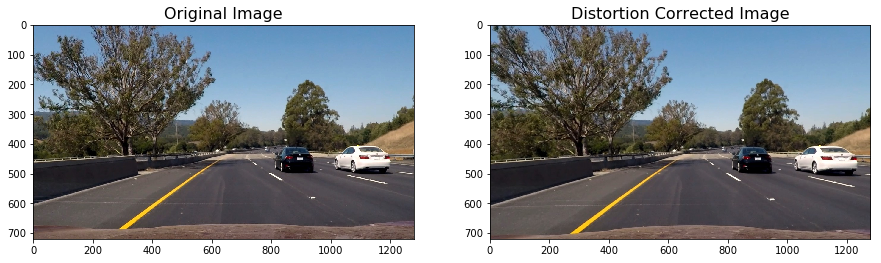

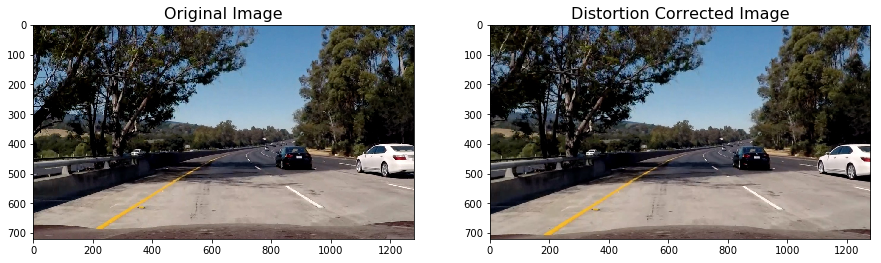

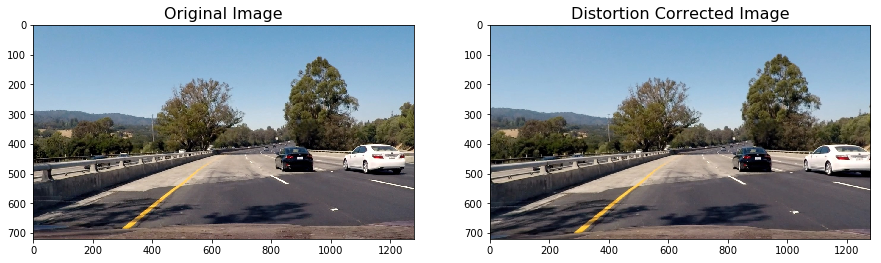

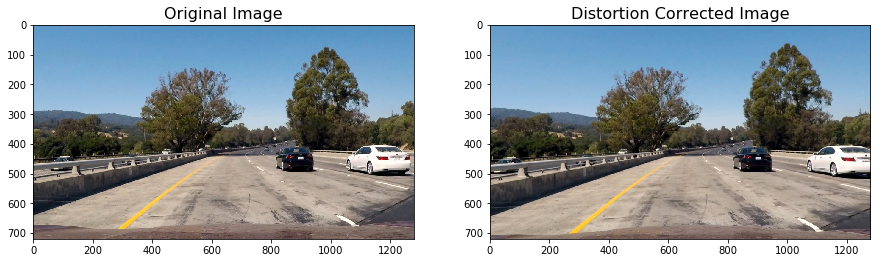

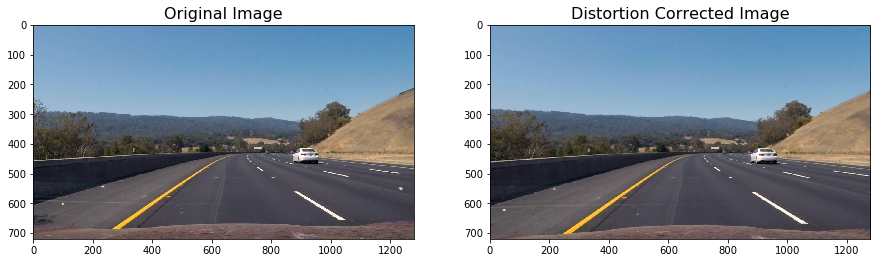

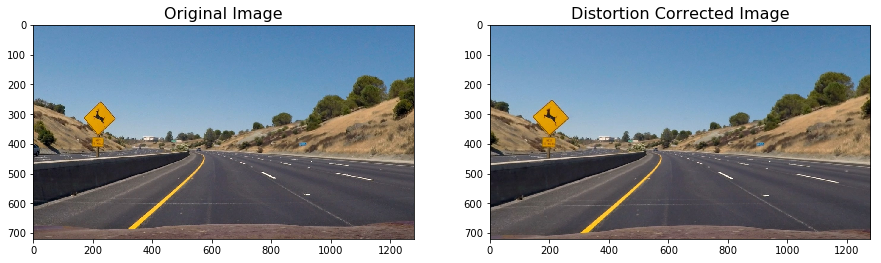

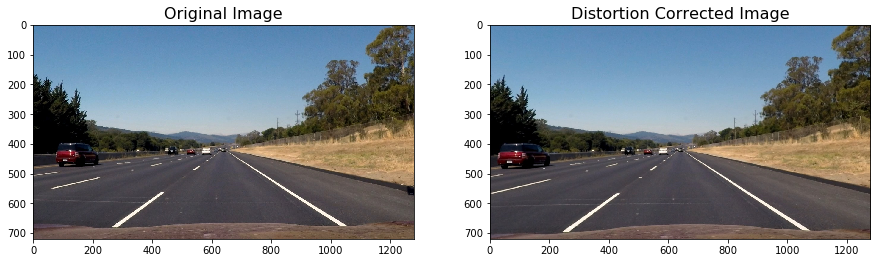

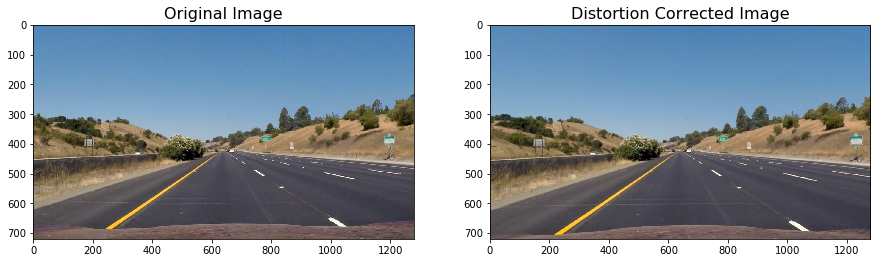

In [5]:
def distortion_correction(idx, img, show=True, read = True):
    image_name = img.split('/', 1 )[1]
    image_name = image_name.split('.', 1 )[0]
    if read:
        img = cv2.imread(img)
    image_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, image_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    if show:
        f, (axis1, axis2) = plt.subplots(1, 2, figsize=(15,10))
        axis1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axis1.set_title('Original Image', fontsize=16)
        axis2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        axis2.set_title('Distortion Corrected Image', fontsize=16)
    else:
        return undist        
test_images = 'test_images/*.jpg'    
test_images_list = glob.glob(test_images)
for i, image in zip(range(len(test_images_list)), test_images_list):
    distortion_correction(i, image)

In [6]:
# Use color transforms, gradients, etc., to create a thresholded binary image.

#Apply a perspective transform to rectify binary image ("birds-eye view").

In [7]:
#pipeline made & tested to create a threshold binary image ! 

In [8]:
# Next up : Apply a perspective transform to rectify binary images 

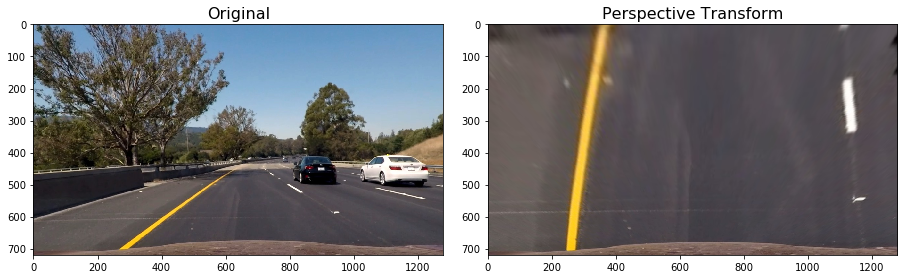

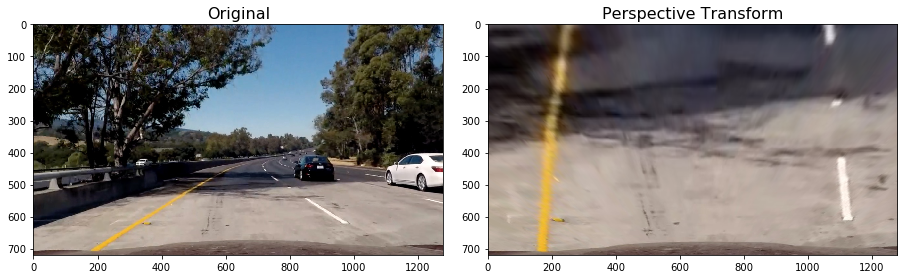

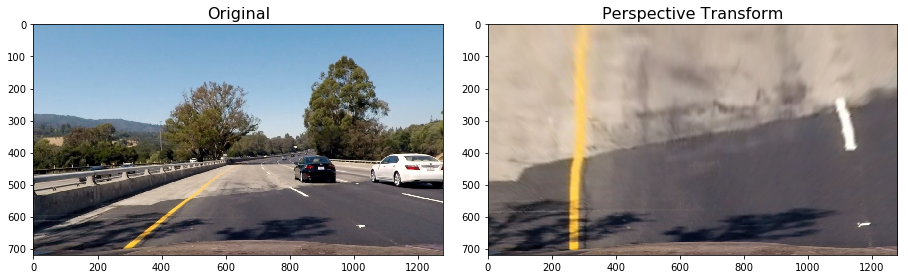

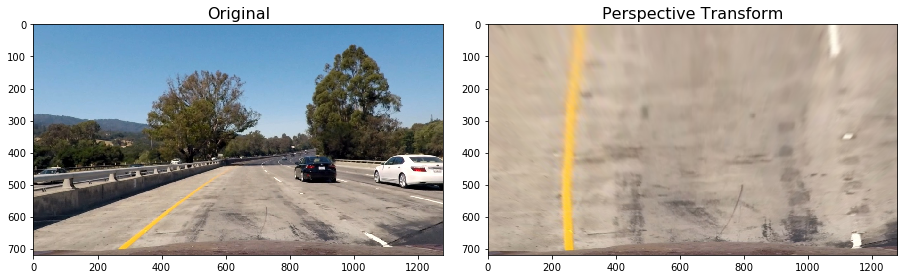

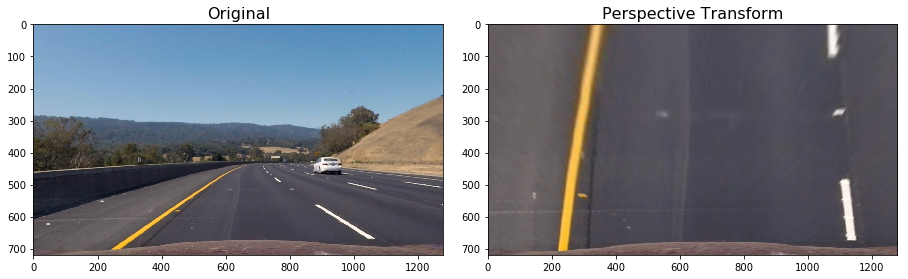

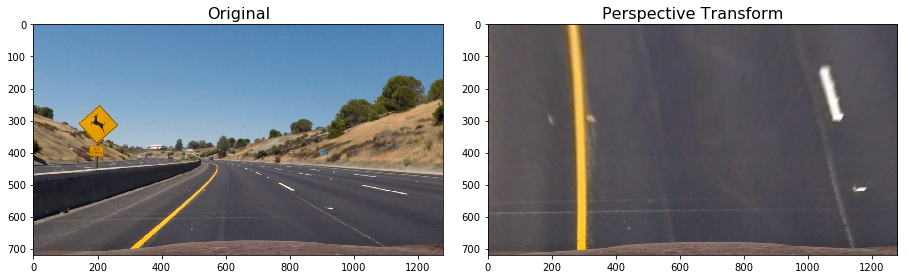

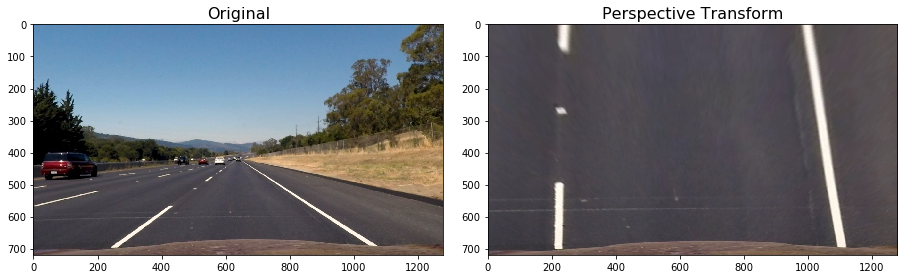

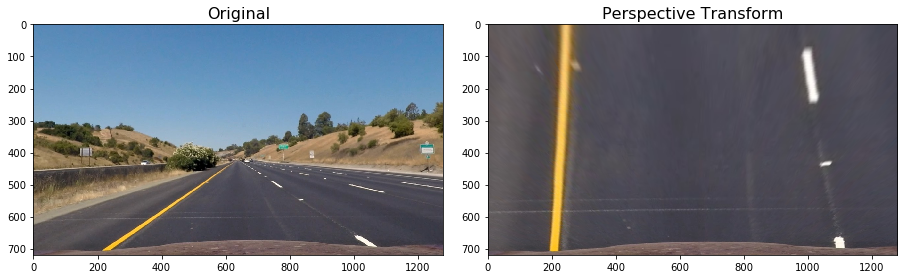

In [9]:
# Do perspective transform
def perspective_transform(idx, image, display=True, read = True):
    image_name = image.split('/', 1 )[1]
    image_name = image_name.split('.', 1 )[0]
    if read:
        undist_image = distortion_correction(idx, image, show = False)
    else:
        undist_image = distortion_correction(idx, image, show = False, read = False) 
    image_size = (undist_image.shape[1], undist_image.shape[0])
    
    offset = 0
    source = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    destination = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    M = cv2.getPerspectiveTransform(source, destination)
    warped = cv2.warpPerspective(undist_image, M, image_size)
    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 7))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(undist_image, cv2.COLOR_BGR2RGB))
        ax1.set_title('Original', fontsize=16)
        ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        ax2.set_title('Perspective Transform', fontsize=16)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    else:
        return warped, M
     
for image in glob.glob(test_images):
    idx=0
    perspective_transform(idx, image)
    idx = idx+1

In [10]:
# Apply Binary Thresholds.

In [11]:
output_images = 'output_images/4.binary_thresholds_Output'
if not os.path.exists(output_images):
    os.makedirs(output_images)

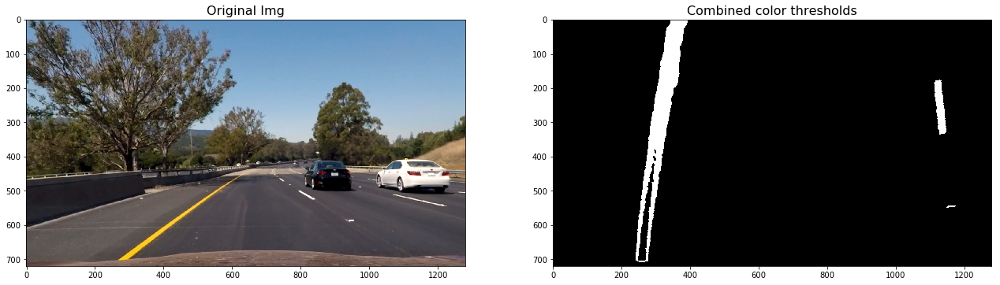

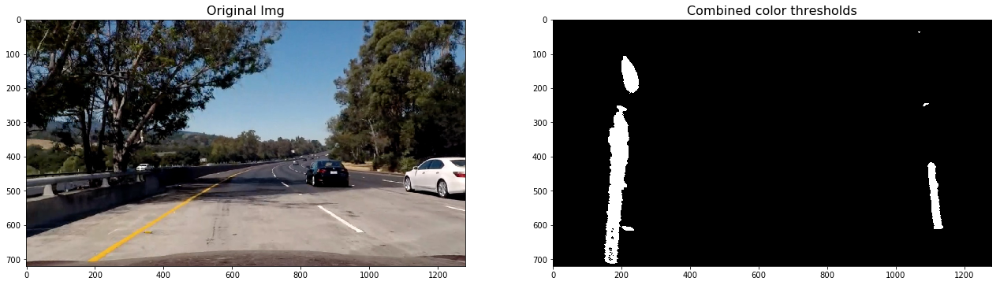

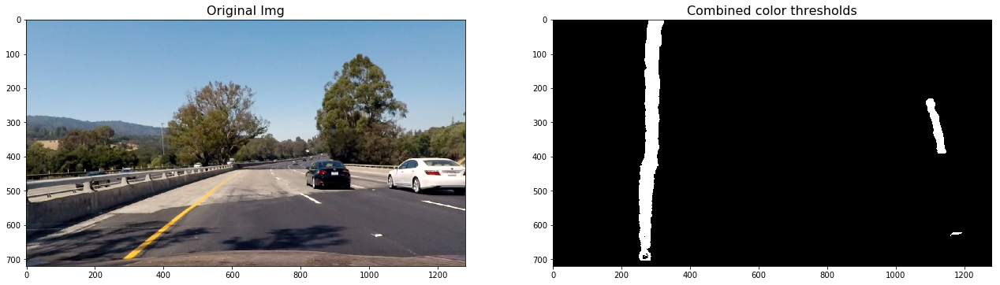

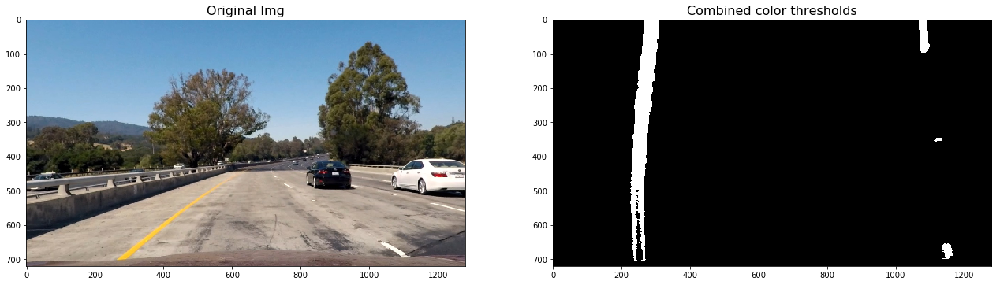

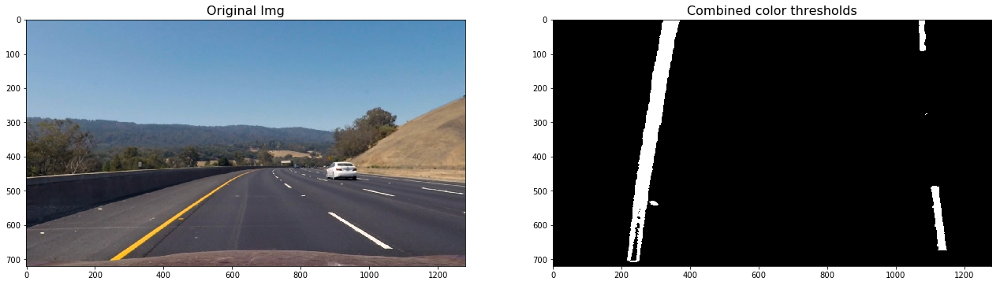

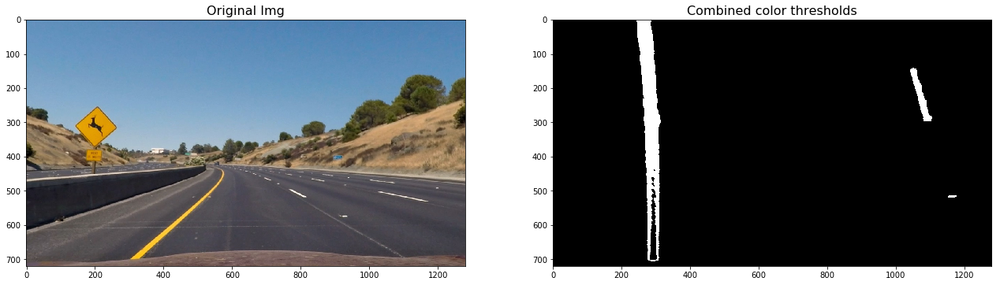

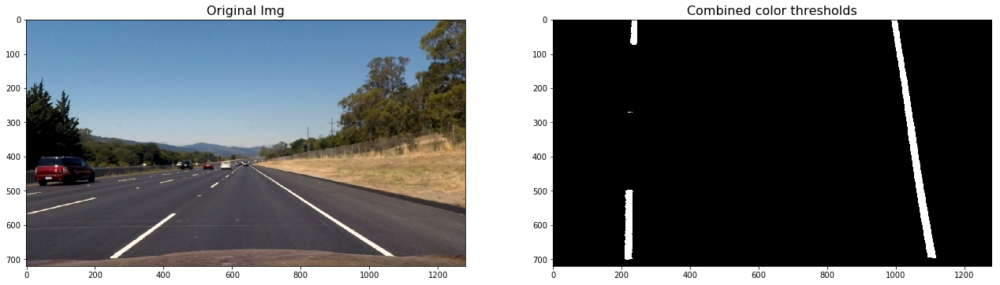

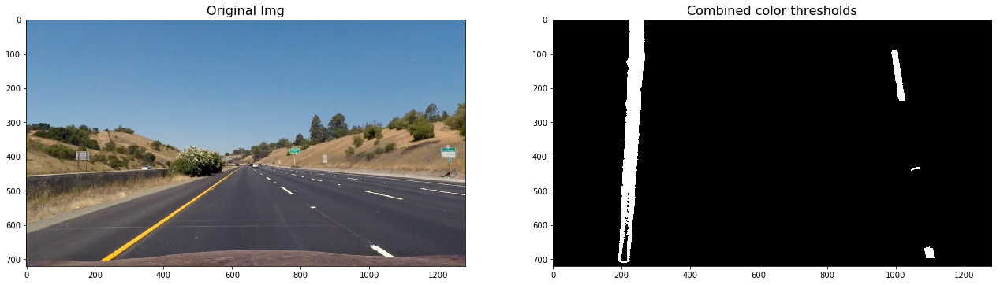

In [12]:
def threshold(idx, image, show=True):
    name = image.split('/', 1 )[1]
    name = name.split('.', 1 )[0]
    
    img, M = perspective_transform(idx, image, display = False)

    s_channel_of_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    l_channel_of_luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)[:,:,0]
    b_channel_of_bgr = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[:,:,2]   

    # Defining threshold of the color channels used
    s_threshold_min = 180
    s_threshold_max = 255
    s_binary = np.zeros_like(s_channel_of_hls)
    s_binary[(s_channel_of_hls >= s_threshold_min) & (s_channel_of_hls <= s_threshold_max)] = 1
    
    l_threshold_min = 225
    l_threshold_max = 255
    l_binary = np.zeros_like(l_channel_of_luv)
    l_binary[(l_channel_of_luv >= l_threshold_min) & (l_channel_of_luv <= l_threshold_max)] = 1

    b_threshold_min = 155
    b_threshold_max = 200
    b_binary = np.zeros_like(b_channel_of_bgr)
    b_binary[(b_channel_of_bgr >= b_threshold_min) & (b_channel_of_bgr <= b_threshold_max)] = 1
        
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1

    if show == True: 
        # Plotting thresholded images
        f, (ax1, ax6) = plt.subplots(1, 2, figsize=(17,13))
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
        ax1.set_title('Original Img', fontsize=16)
        ax1.imshow(cv2.cvtColor(distortion_correction(idx, image, show=False),cv2.COLOR_BGR2RGB))

        ax6.set_title('Combined color thresholds', fontsize=16)
        ax6.imshow(combined_binary, cmap='gray')
        
        plt.savefig(output_images+"/"+name+'_out.jpg')
    else: 
        return combined_binary
    
for image in glob.glob(test_images):
    idx = 0
    threshold(idx, image)
    idx = idx+1


In [13]:
color_folder = 'output_images/5.color_lanes_Output'
if not os.path.exists(color_folder):
    os.makedirs(color_folder)

In [20]:
#Detect & Plot Lanes
def advanced_lane(idx, image):
        
    image_name = image.split('/', 1 )[1]
    image_name = image_name.split('.', 1 )[0]
    collated_binary_image = threshold(idx, image, show=False)
    
    right_x = []
    left_x = []
    
    left_y = []
    right_y = []
        
    x, y = np.nonzero(np.transpose(collated_binary_image))
    
    i = 720
    j = 630
    
    CTR = 90
    while j >= 0:
        histogram_bars = np.sum(collated_binary_image[j:i,:], axis=0)
        
        # Calculations for left peak
        left_peak = np.argmax(histogram_bars[:640])
        x_index = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        window_x, window_y = x[x_index], y[x_index]
        if np.sum(window_x) != 0:
            left_x.extend(window_x.tolist())
            left_y.extend(window_y.tolist())

        # Calculations for right peak    
        right_peak = np.argmax(histogram_bars[640:]) + 640
        x_index = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        window_x, window_y = x[x_index], y[x_index]
        if np.sum(window_x) != 0:
            right_x.extend(window_x.tolist())
            right_y.extend(window_y.tolist())
        i -= CTR
        j -= CTR

    left_y = np.array(left_y).astype(np.float32)
    left_x = np.array(left_x).astype(np.float32)
    
    right_y = np.array(right_y).astype(np.float32)
    right_x = np.array(right_x).astype(np.float32)
    
    left_lane_fit = np.polyfit(left_y, left_x, 2)
    left_lane_fitx = left_lane_fit[0]*left_y**2 + left_lane_fit[1]*left_y + left_lane_fit[2]
    
    right_lane_fit = np.polyfit(right_y, right_x, 2)
    right_lane_fitx = right_lane_fit[0]*right_y**2 + right_lane_fit[1]*right_y + right_lane_fit[2]
    
    right_x_int = right_lane_fit[0]*720**2 + right_lane_fit[1]*720 + right_lane_fit[2]
    right_x = np.append(right_x,right_x_int)
    right_y = np.append(right_y, 720)
    
    right_x = np.append(right_x, right_lane_fit[0]*0**2 + right_lane_fit[1]*0 + right_lane_fit[2])
    right_y = np.append(right_y, 0)
    
    left_x_int = left_lane_fit[0]*720**2 + left_lane_fit[1]*720 + left_lane_fit[2]
    left_x = np.append(left_x, left_x_int)
    left_y = np.append(left_y, 720)
    
    left_x = np.append(left_x, left_lane_fit[0]*0**2 + left_lane_fit[1]*0 + left_lane_fit[2])
    left_y = np.append(left_y, 0)
    
    lsort = np.argsort(left_y)
    rsort = np.argsort(right_y)
    
    left_y = left_y[lsort]
    left_x = left_x[lsort]
    
    right_y = right_y[rsort]
    right_x = right_x[rsort]
    
    left_lane_fit = np.polyfit(left_y, left_x, 2)
    left_lane_fitx = left_lane_fit[0]*left_y**2 + left_lane_fit[1]*left_y + left_lane_fit[2]
    right_lane_fit = np.polyfit(right_y, right_x, 2)
    right_lane_fitx = right_lane_fit[0]*right_y**2 + right_lane_fit[1]*right_y + right_lane_fit[2]
    
    # Find radius of curvature for both lane line
    xm_per_pix = 3.7/700 # meteres/pixel in x dimension
    ym_per_pix = 30.0/720 # meters/pixel in y dimension
   
    left_lane_fit_curvature = np.polyfit(left_y*ym_per_pix, left_x*xm_per_pix, 2)
    right_lane_fit_curvature = np.polyfit(right_y*ym_per_pix, right_x*xm_per_pix, 2)
    radius_left_curve = ((1 + (2*left_lane_fit_curvature[0]*np.max(left_y) + left_lane_fit_curvature[1])**2)**1.5) \
                                 /np.absolute(2*left_lane_fit_curvature[0])
    radius_right_curve = ((1 + (2*right_lane_fit_curvature[0]*np.max(left_y) + right_lane_fit_curvature[1])**2)**1.5) \
                                    /np.absolute(2*right_lane_fit_curvature[0])
    
    
    # Find position of the vehicle
    vehicles_center = abs(640 - ((right_x_int+left_x_int)/2))
    
    # offset = 0 
    #img_size = (img.shape[1], img.shape[0])
    img_size = (img.shape[1], img.shape[0])
    source = np.float32([[490, 482],[810, 482],
                      [1250, 720],[40, 720]])
    destination = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    Minv = cv2.getPerspectiveTransform(destination, source)
    
    warp_zero = np.zeros_like(collated_binary_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_lane_fitx, left_y])))])
    pts_right = np.array([np.transpose(np.vstack([right_lane_fitx, right_y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0, 0, 255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    new_warp = cv2.warpPerspective(color_warp, Minv, (collated_binary_image.shape[1], collated_binary_image.shape[0]))
    result = cv2.addWeighted(mpimg.imread(image), 1, new_warp, 0.5, 0)
    
    f, (axis1, axis2) = plt.subplots(1,2, figsize=(15, 11))
    axis1.imshow(cv2.cvtColor((perspective_transform(idx, image, display=False)[0]), cv2.COLOR_BGR2RGB))
    axis1.set_xlim(0, 1280)
    axis1.set_ylim(0, 768)
    axis1.plot(left_lane_fitx, left_y, color='green', linewidth=3)
    axis1.plot(right_lane_fitx, right_y, color='green', linewidth=3)
    axis1.set_title('Polynomial fit to Lane Lines', fontsize=16)
    axis1.invert_yaxis() # to visualize as we do the images
    axis2.imshow(result)
    axis2.set_title('Color Lane Between Polynomials', fontsize=16)
#     if vehicles_center < 640:
#         axis2.text(230, 50, 'Vehicle is left of center by : {:.2f}m'.format(vehicles_center*3.7/700),
#                  style='italic', color='white', fontsize=14)
#     else:
#         axis2.text(230, 50, 'Vehicle is right of center by : {:.2f}m'.format(vehicles_center*3.7/700),
#                  style='normal', color='white', fontsize=14)
    axis2.text(400, 50, ' curvature : {}m'.format(int((radius_left_curve + radius_right_curve)/2)),
             style='normal', color='white', fontsize=14)
    plt.savefig(color_folder+"/"+image_name+'_out.jpg')


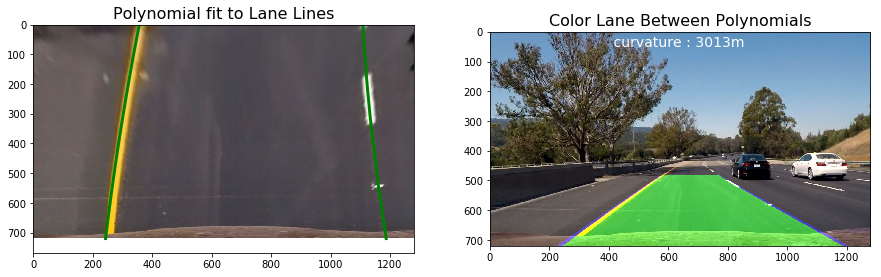

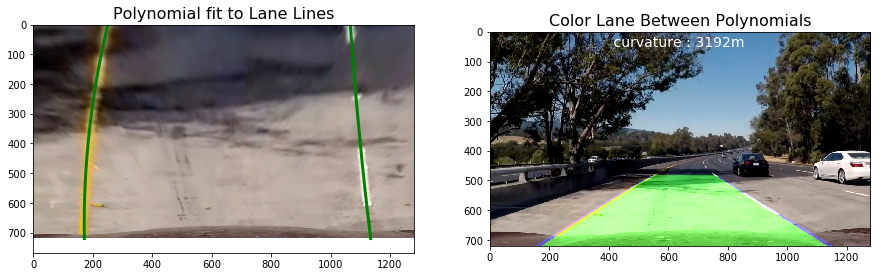

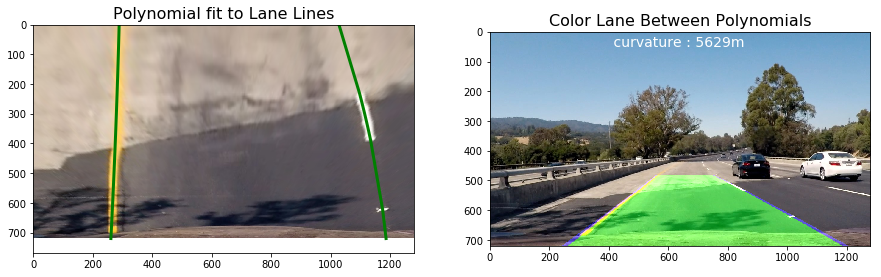

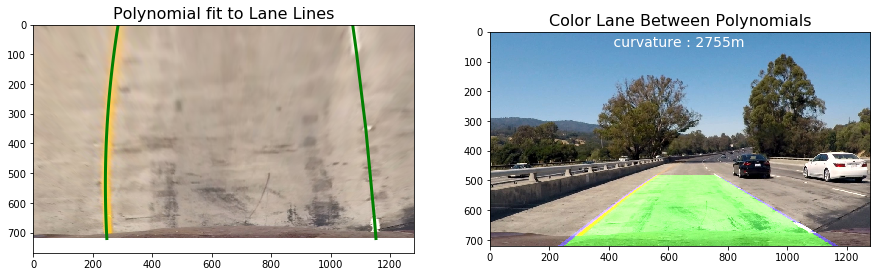

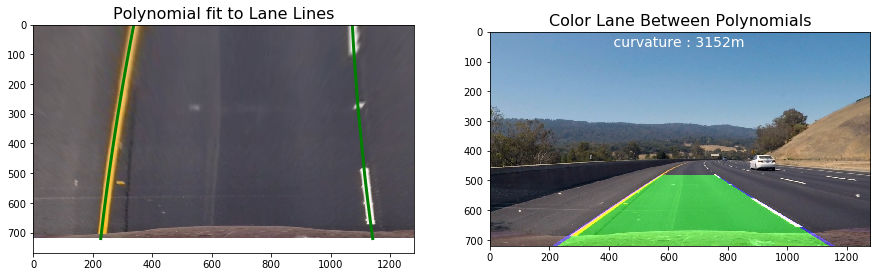

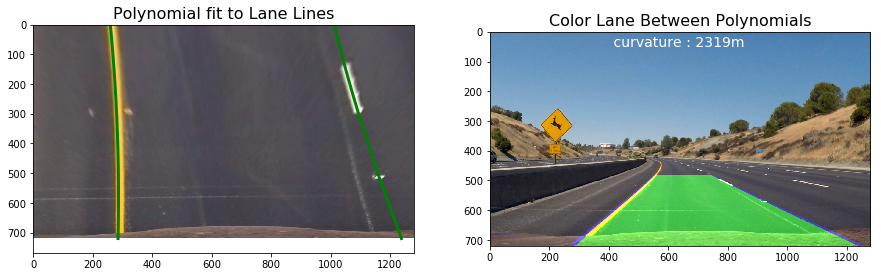

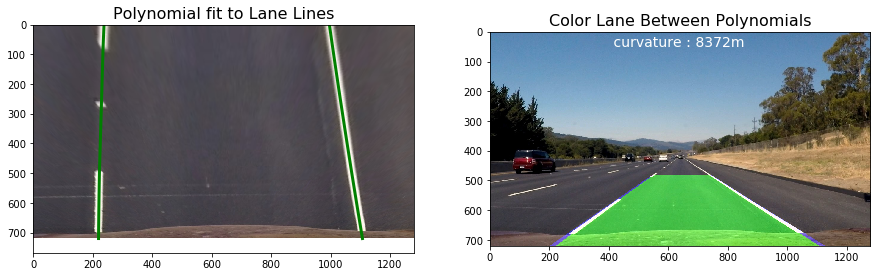

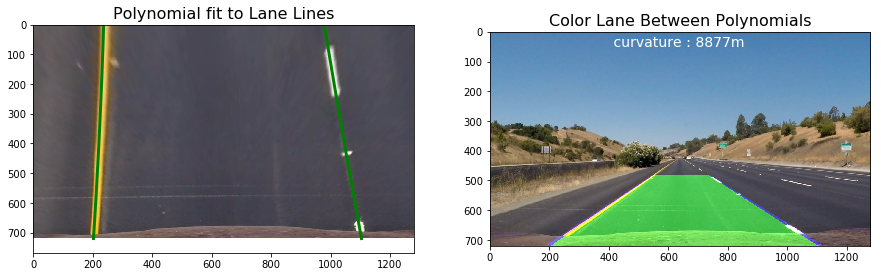

In [21]:
for image in glob.glob(test_images):
    i = 0
    advanced_lane(i, image)
    i = i + 1

In [22]:
class Line:
    def __init__(self):
        MAX_LEN = 10
        # Is the line found in the previous frame
        self.found = False
        
        # Memorize last x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        
        # Memorize radius of curvature
        self.radius = None
        
        # Store recent polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=MAX_LEN)
        self.fit1 = deque(maxlen=MAX_LEN)
        self.fit2 = deque(maxlen=MAX_LEN)
        
        self.fitx = None
        self.pts = []
        
        # Memorize x and y values of lanes in previous frame
        self.X = None
        self.Y = None
        
        # Keep recent 'x' intercepts avg. across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
           
        # Count of number of frames
        self.count = 0
        
    def targeted_search(self, x, y):
        x_vals = []
        y_vals = []
        if self.found == True: 
            i = 720
            j = 630
            while j >= 0:
                y_val = np.mean([i,j])
                x_val = (np.mean(self.fit0))*y_val**2 + (np.mean(self.fit1))*y_val + (np.mean(self.fit2))
                x_idx = np.where((((x_val - 25) < x)&(x < (x_val + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    np.append(x_vals, x_window)
                    np.append(y_vals, y_window)
                i -= 90
                j -= 90
        if np.sum(x_vals) == 0: 
            self.found = False
        return x_vals, y_vals, self.found
    def random_search(self, x, y, image):
        x_vals = []
        y_vals = []
        if self.found == False: 
            i = 720
            j = 630
            while j >= 0:
                histogram = np.sum(image[j:i,:], axis=0)
                if self == Right:
                    peak = np.argmax(histogram[640:]) + 640
                else:
                    peak = np.argmax(histogram[:640])
                x_idx = np.where((((peak - 25) < x)&(x < (peak + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    x_vals.extend(x_window)
                    y_vals.extend(y_window)
                i -= 90
                j -= 90
        if np.sum(x_vals) > 0:
            self.found = True
        else:
            y_vals = self.Y
            x_vals = self.X
        return x_vals, y_vals, self.found
    
    def find_intercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        return bottom, top
    
    def calculate_radius_of_curvature(self, x_vals, y_vals):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(y_vals*ym_per_pix, x_vals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(y_vals) + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return curverad
    
    def sort_values(self, x_vals, y_vals):
        sorted_index = np.argsort(y_vals)
        sorted_y_vals = y_vals[sorted_index]
        sorted_x_vals = x_vals[sorted_index]
        return sorted_x_vals, sorted_y_vals

In [40]:
def pipeline(image):
    image_size = (image.shape[1], image.shape[0])
    
    # Calibrate, undistort
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, image_size, None, None)
    undistorted_image = cv2.undistort(image, mtx, dist, None, mtx)
    
    # Perform perspective transform
    source = np.float32([[490, 482],[810, 482],
                      [1250, 720],[0, 720]])
    destination = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    M = cv2.getPerspectiveTransform(source, destination)
    warped_image = cv2.warpPerspective(undistorted_image, M, image_size)
    
    # threshold
    b_channel_of_lab = cv2.cvtColor(warped_image, cv2.COLOR_RGB2Lab)[:,:,2]
    l_channel_of_luv = cv2.cvtColor(warped_image, cv2.COLOR_RGB2LUV)[:,:,0]  
    
    b_threshold_min = 145
    b_threshold_max = 200
    b_binary_img = np.zeros_like(b_channel_of_lab)
    b_binary_img[(b_channel_of_lab >= b_threshold_min) & (b_channel_of_lab <= b_threshold_max)] = 1
    
    l_threshold_min = 215
    l_threshold_max = 255
    l_binary_img = np.zeros_like(l_channel_of_luv)
    l_binary_img[(l_channel_of_luv >= l_threshold_min) & (l_channel_of_luv <= l_threshold_max)] = 1

    combined_binary_img = np.zeros_like(b_binary_img)
    combined_binary_img[(l_binary_img == 1) | (b_binary_img == 1)] = 1
    
    x, y = np.nonzero(np.transpose(combined_binary_img)) 

    if Left.found == True: 
        left_x, left_y, Left.found = Left.targeted_search(x, y)
        
    if Right.found == True: 
        right_x, right_y, Right.found = Right.targeted_search(x, y)

            
    if Right.found == False: 
        right_x, right_y, Right.found = Right.random_search(x, y, combined_binary_img)
            
    if Left.found == False: 
        left_x, left_y, Left.found = Left.random_search(x, y, combined_binary_img)

    left_y = np.array(left_y).astype(np.float32)
    left_x = np.array(left_x).astype(np.float32)
    right_y = np.array(right_y).astype(np.float32)
    right_x = np.array(right_x).astype(np.float32)
            
    left_fit = np.polyfit(left_y, left_x, 2)
    
    left_x_int, left_top = Left.find_intercepts(left_fit)
    
    Left.x_int.append(left_x_int)
    Left.top.append(left_top)
    left_x_int = np.mean(Left.x_int)
    left_top = np.mean(Left.top)
    Left.lastx_int = left_x_int
    Left.last_top = left_top
    
    left_x = np.append(left_x, left_x_int)
    left_y = np.append(left_y, 720)
    left_x = np.append(left_x, left_top)
    left_y = np.append(left_y, 0)
    
    left_x, left_y = Left.sort_values(left_x, left_y)
    
    Left.X = left_x
    Left.Y = left_y
    
    left_fit = np.polyfit(left_y, left_x, 2)
    Left.fit0.append(left_fit[0])
    Left.fit1.append(left_fit[1])
    Left.fit2.append(left_fit[2])
    left_fit = [np.mean(Left.fit0), np.mean(Left.fit1), np.mean(Left.fit2)]
    
    left_fit_x = left_fit[0]*left_y**2 + left_fit[1]*left_y + left_fit[2]
    Left.fitx = left_fit_x
    
    right_fit = np.polyfit(right_y, right_x, 2)

    right_x_int, right_top = Right.find_intercepts(right_fit)
    
    Right.x_int.append(right_x_int)
    right_x_int = np.mean(Right.x_int)
    Right.top.append(right_top)
    right_top = np.mean(Right.top)
    Right.lastx_int = right_x_int
    Right.last_top = right_top
    right_x = np.append(right_x, right_x_int)
    right_y = np.append(right_y, 720)
    right_x = np.append(right_x, right_top)
    right_y = np.append(right_y, 0)
    
    right_x, right_y = Right.sort_values(right_x, right_y)
    Right.X = right_x
    Right.Y = right_y
    
    right_fit = np.polyfit(right_y, right_x, 2)
    Right.fit0.append(right_fit[0])
    Right.fit1.append(right_fit[1])
    Right.fit2.append(right_fit[2])
    right_fit = [np.mean(Right.fit0), np.mean(Right.fit1), np.mean(Right.fit2)]
    
    right_fitx = right_fit[0]*right_y**2 + right_fit[1]*right_y + right_fit[2]
    Right.fitx = right_fitx
        
    radius_left_curve = Left.calculate_radius_of_curvature(left_x, left_y)
    radius_right_curve = Right.calculate_radius_of_curvature(right_x, right_y)
        
    if Left.count % 3 == 0:
        Left.radius = radius_left_curve
        Right.radius = radius_right_curve
        
    position = (right_x_int + left_x_int)/2
    distance_from_center = abs((640 - position)*3.7/700) 
                
    Minv = cv2.getPerspectiveTransform(destination, source)
    
    warped_zero = np.zeros_like(combined_binary_img).astype(np.uint8)
    color_warped = np.dstack((warped_zero, warped_zero, warped_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.fitx, Left.Y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right.Y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warped, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warped, np.int_(pts), (34,255,34))
    new_warped = cv2.warpPerspective(color_warped, Minv, (image.shape[1], image.shape[0]))
    result = cv2.addWeighted(undistorted_image, 1, new_warped, 0.5, 0)
        
    if position > 640:
        cv2.putText(result, 'Vehicle off center to left by : {:.2f}m'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, 'Vehicle off center to right by : {:.2f}m'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    cv2.putText(result, 'Radius of lane curvature : {}m'.format(int((Left.radius+Right.radius)/2)), (120,140),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    Left.count += 1
    return result

In [41]:
output = 'output_videos'
if not os.path.exists(output):
    os.makedirs(output)

In [42]:
import time

Left = Line()
Right = Line()
video_output = output+'/project_video_ouput.mp4'
clip1 = VideoFileClip("project_video.mp4")

white_clip = clip1.fl_image(pipeline) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_videos/project_video_ouput.mp4
[MoviePy] Writing video output_videos/project_video_ouput.mp4



 12%|█▏        | 152/1261 [02:09<15:39,  1.18it/s]


 24%|██▍       | 303/1261 [04:18<13:47,  1.16it/s]


 36%|███▌      | 454/1261 [06:36<11:18,  1.19it/s]


 48%|████▊     | 605/1261 [08:44<09:12,  1.19it/s]


 60%|█████▉    | 756/1261 [11:01<07:12,  1.17it/s]


 72%|███████▏  | 907/1261 [13:23<05:21,  1.10it/s]


 84%|████████▍ | 1057/1261 [15:41<03:06,  1.09it/s]


 96%|█████████▌| 1205/1261 [17:56<00:51,  1.09it/s]


100%|█████████▉| 1260/1261 [18:48<00:00,  1.00it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video_ouput.mp4 

